<a href="https://colab.research.google.com/github/Rakeshvd/Fisheries-monitoring-to-stop-illegal-practices-/blob/master/Fishy%20Classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from fastai import *
from fastai.vision import *

In [3]:
from google.colab import files
uploaded = files.upload()

Saving trainit.zip to trainit.zip


In [4]:
!unzip trainit.zip

Archive:  trainit.zip
   creating: train/ALB/
  inflating: train/ALB/img_04907.jpg  
  inflating: train/ALB/img_04915.jpg  
  inflating: train/ALB/img_04917.jpg  
  inflating: train/ALB/img_04920.jpg  
  inflating: train/ALB/img_04939.jpg  
  inflating: train/ALB/img_04950.jpg  
  inflating: train/ALB/img_04951.jpg  
  inflating: train/ALB/img_04954.jpg  
  inflating: train/ALB/img_04955.jpg  
  inflating: train/ALB/img_04963.jpg  
  inflating: train/ALB/img_04965.jpg  
  inflating: train/ALB/img_04968.jpg  
  inflating: train/ALB/img_04969.jpg  
  inflating: train/ALB/img_04973.jpg  
  inflating: train/ALB/img_04976.jpg  
  inflating: train/ALB/img_04979.jpg  
  inflating: train/ALB/img_04980.jpg  
  inflating: train/ALB/img_04981.jpg  
  inflating: train/ALB/img_04982.jpg  
  inflating: train/ALB/img_04983.jpg  
  inflating: train/ALB/img_04987.jpg  
  inflating: train/ALB/img_04994.jpg  
  inflating: train/ALB/img_05675.jpg  
  inflating: train/ALB/img_05677.jpg  
  inflating: train

In [0]:
classes = ['ALB','BET','DOL','LAG','NoF','OTHER','SHARK','YFT']

In [0]:
path = Path('train/')
np.random.seed(42)
data = ImageDataBunch.from_folder(path, train=".", valid_pct=0.2,
        ds_tfms=get_transforms(), size=224, num_workers=4).normalize(imagenet_stats)

In [7]:
data.classes

['ALB', 'BET', 'DOL', 'LAG', 'NoF', 'OTHER', 'SHARK', 'YFT']

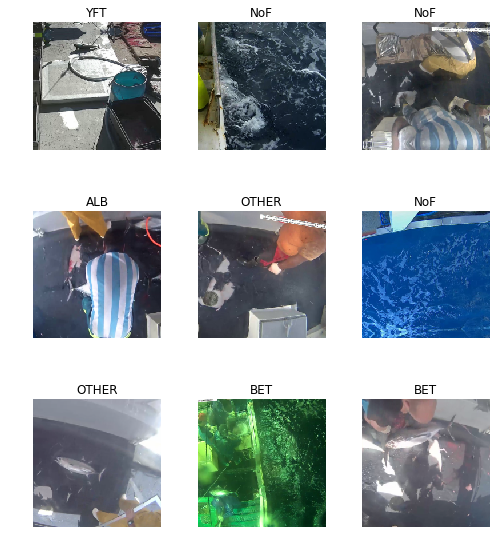

In [8]:
data.show_batch(rows=3, figsize=(7,8))

In [9]:
data.classes, data.c, len(data.train_ds), len(data.valid_ds)

(['ALB', 'BET', 'DOL', 'LAG', 'NoF', 'OTHER', 'SHARK', 'YFT'], 8, 1580, 395)

In [10]:
learn = create_cnn(data, models.resnet34, metrics=error_rate)

/usr/local/lib/python3.6/dist-packages/fastai/vision/learner.py:106: UserWarning: `create_cnn` is deprecated and is now named `cnn_learner`.
  warn("`create_cnn` is deprecated and is now named `cnn_learner`.")
Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 87306240/87306240 [00:00<00:00, 89656484.72it/s]


In [11]:
learn.fit_one_cycle(10)

epoch,train_loss,valid_loss,error_rate,time
0,2.305216,1.586616,0.529114,01:37
1,1.858532,1.014615,0.326582,01:36
2,1.486942,0.768313,0.270886,01:36
3,1.256257,0.665921,0.217722,01:36
4,1.092350,0.592761,0.215190,01:36
5,0.966455,0.514428,0.149367,01:36
6,0.853253,0.484243,0.151899,01:35
7,0.765494,0.455087,0.144304,01:34
8,0.690217,0.441901,0.144304,01:34
9,0.665286,0.441434,0.144304,01:34


In [0]:
learn.save('stage-1')

In [0]:
learn.unfreeze()

In [14]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


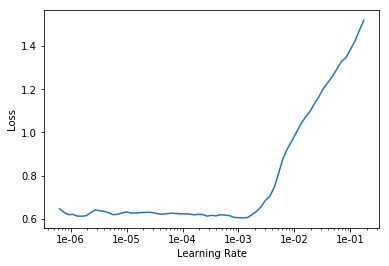

In [15]:
learn.recorder.plot()

In [16]:
learn.fit_one_cycle(10, max_lr=slice(1e-04,1e-03))

epoch,train_loss,valid_loss,error_rate,time
0,0.608984,0.397143,0.126582,01:35
1,0.545953,0.439519,0.167089,01:36
2,0.490697,0.355540,0.116456,01:35
3,0.431042,0.489448,0.134177,01:37
4,0.356422,0.270499,0.078481,01:37
5,0.287026,0.330544,0.081013,01:37
6,0.223757,0.293266,0.096203,01:37
7,0.175713,0.273365,0.078481,01:37
8,0.134950,0.257519,0.073418,01:37
9,0.107870,0.263230,0.078481,01:37


In [0]:
learn.save('stage-2')

In [18]:
learn.load('stage-2')

Learner(data=ImageDataBunch;

Train: LabelList (1580 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
DOL,DOL,DOL,DOL,DOL
Path: train;

Valid: LabelList (395 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
YFT,YFT,BET,ALB,YFT
Path: train;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

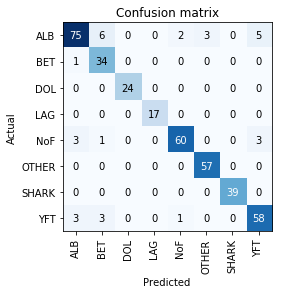

In [20]:
interp.plot_confusion_matrix()

In [21]:
from google.colab import files
uploaded = files.upload()

Saving testit.zip to testit.zip


In [22]:
!unzip testit.zip

Archive:  testit.zip
  inflating: testit/img_00760.jpg    
  inflating: testit/img_00828.jpg    
  inflating: testit/img_00964.jpg    
  inflating: testit/img_02285.jpg    
  inflating: testit/img_02739.jpg    
  inflating: testit/img_02964.jpg    
  inflating: testit/img_03992.jpg    
  inflating: testit/img_05438.jpg    


In [0]:
img1 = open_image('testit/''img_00760.jpg')
img2= open_image('testit/''img_00828.jpg')
img3 = open_image('testit/''img_00964.jpg')
img4 = open_image('testit/''img_02285.jpg')
img5 = open_image('testit/''img_02739.jpg')
img6 = open_image('testit/''img_02964.jpg')
img7 = open_image('testit/''img_03992.jpg')
img8 = open_image('testit/''img_05438.jpg')

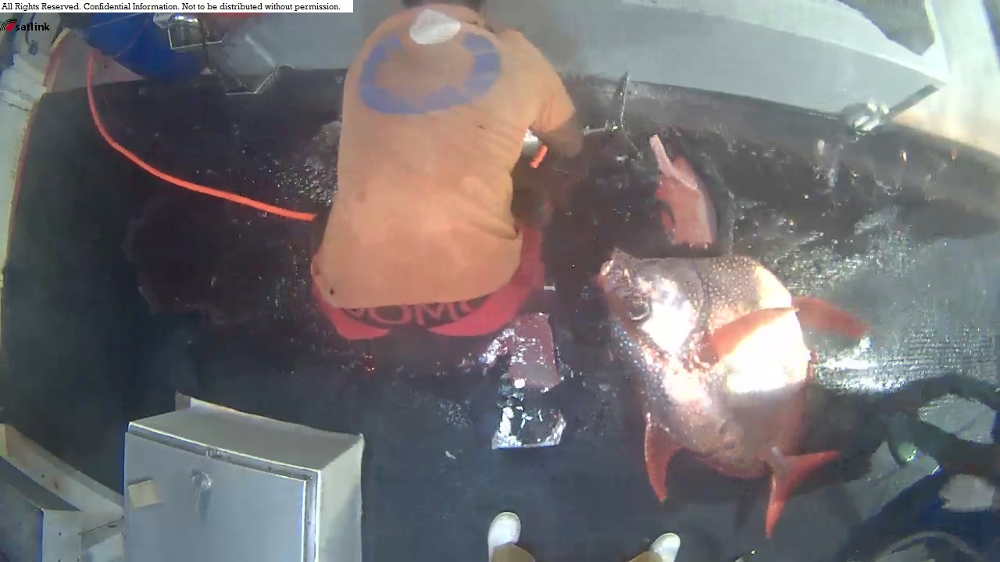

In [24]:
img1

In [26]:
pred_class,pred_idx,outputs = learn.predict(img1)
pred_class

Category LAG

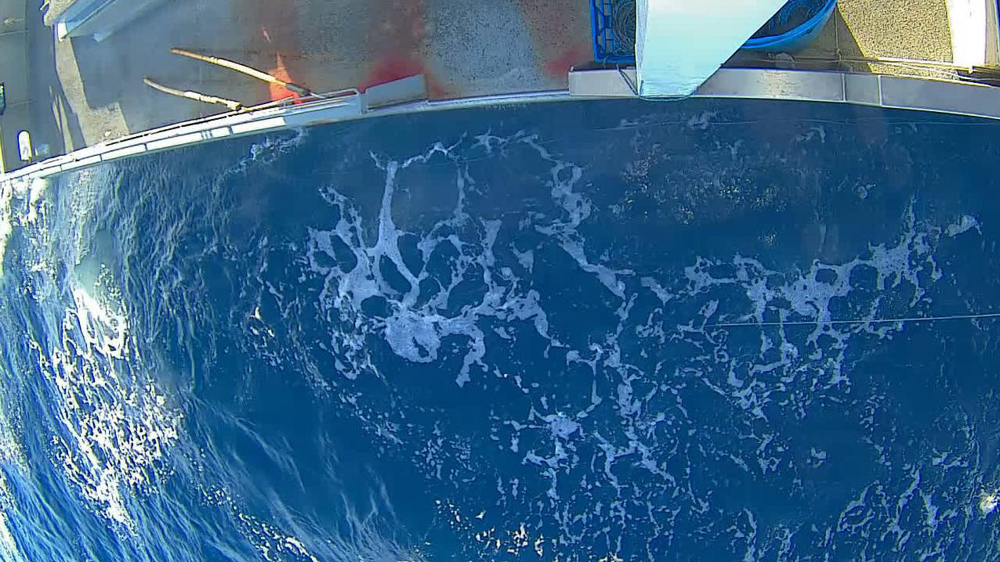

In [27]:
img2

In [28]:
pred_class,pred_idx,outputs = learn.predict(img2)
pred_class

Category NoF

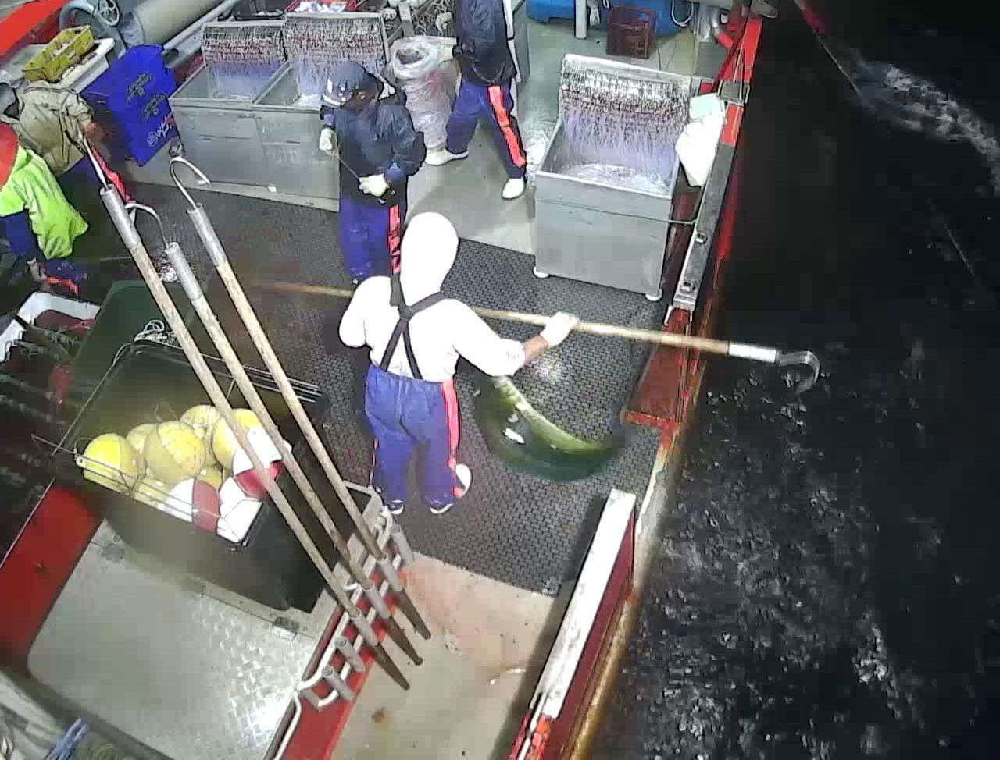

In [29]:
img3

In [30]:
pred_class,pred_idx,outputs = learn.predict(img3)
pred_class

Category DOL

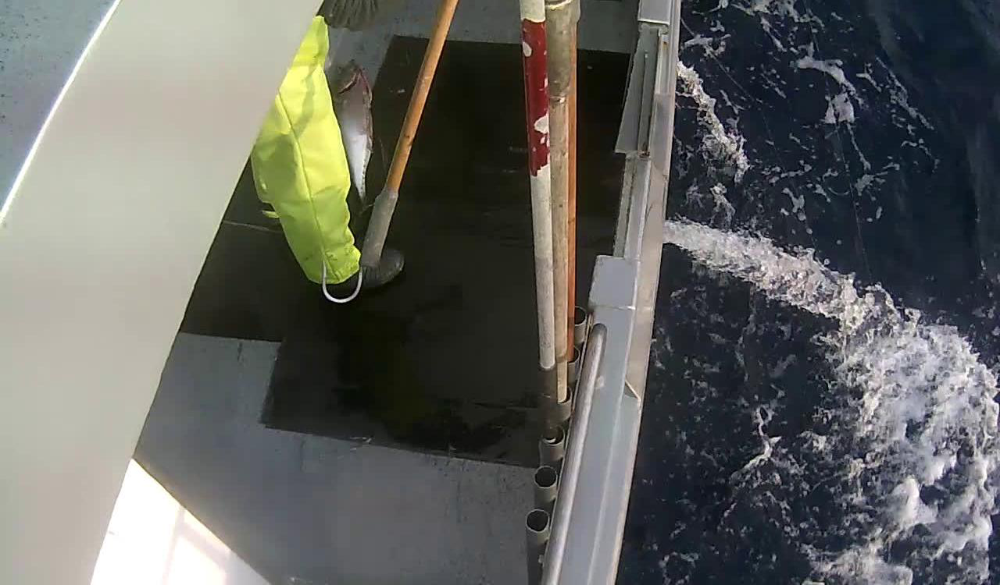

In [31]:
img4

In [32]:
pred_class,pred_idx,outputs = learn.predict(img4)
pred_class

Category NoF

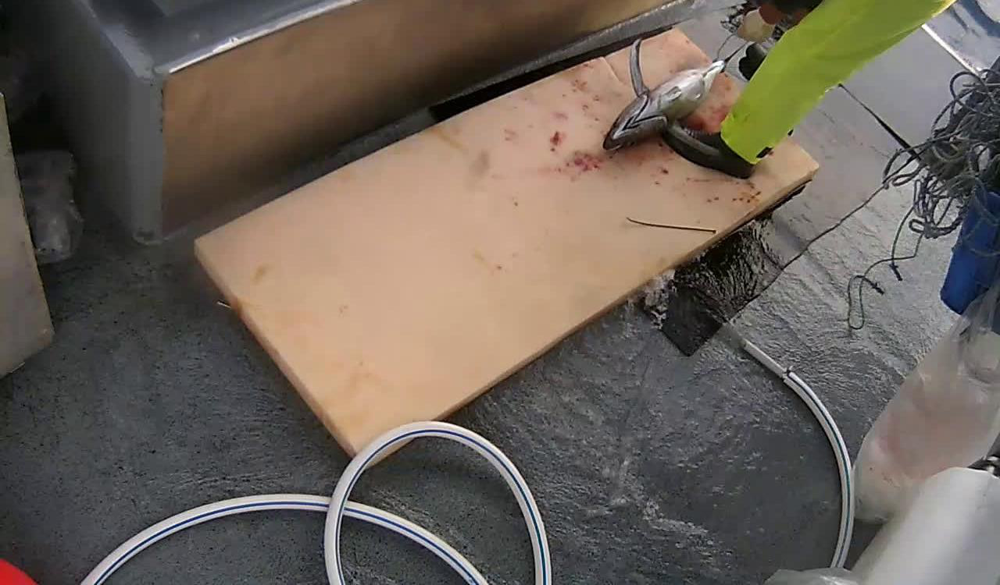

In [33]:
img5

In [34]:
pred_class,pred_idx,outputs = learn.predict(img5)
pred_class

Category ALB

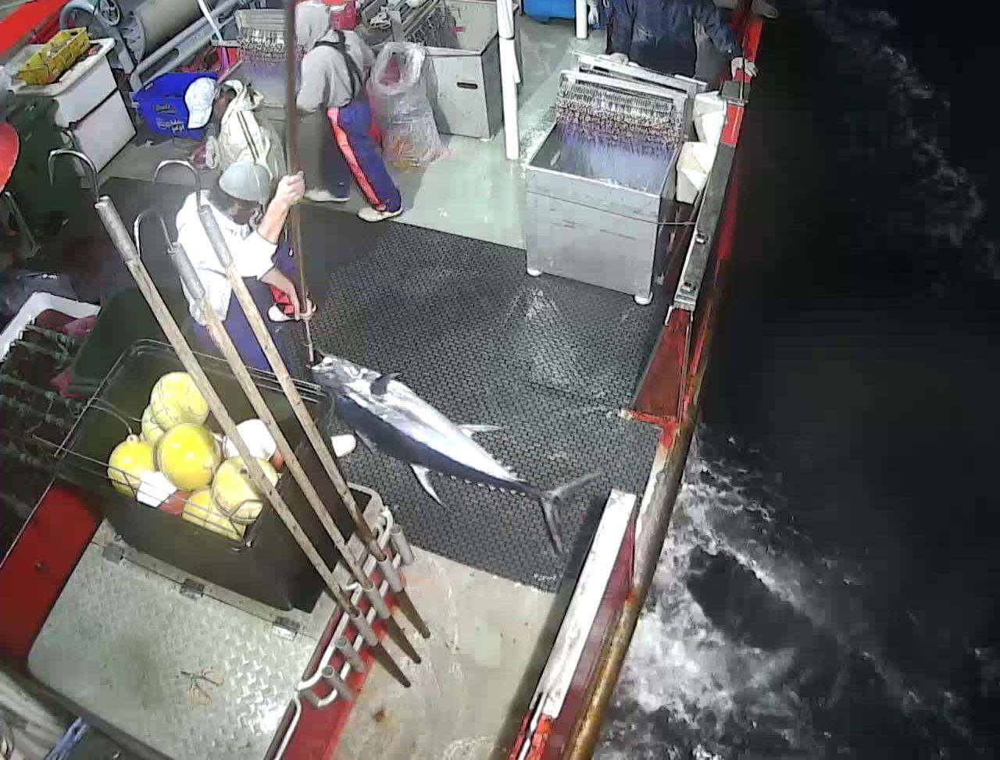

In [35]:
img6

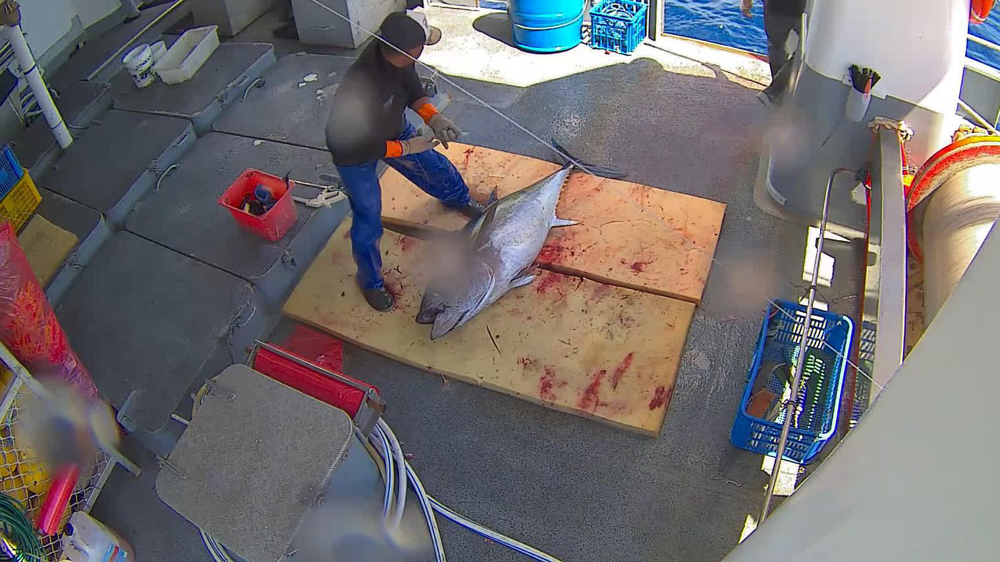

In [37]:
img7

In [38]:
pred_class,pred_idx,outputs = learn.predict(img7)
pred_class

Category BET

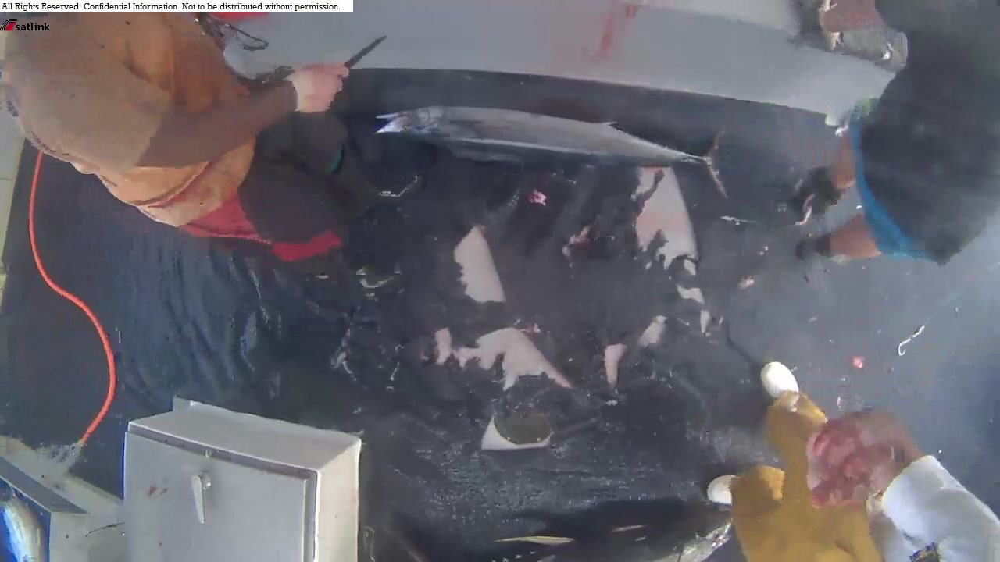

In [39]:
img8

In [40]:
pred_class,pred_idx,outputs = learn.predict(img8)
pred_class

Category ALB